In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,classification_report
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

# Task 1. EDA

## 1.	Load the Mushroom dataset and perform fundamental data exploration.

In [5]:
df=pd.read_csv('mushroom.csv')
df.head()

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245


In [7]:
df.shape

(2000, 26)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

In [11]:
df.describe(include='all')

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
count,2000.000000,2000,2000,2000,2000,2000,2000,2000,2000,2000,...,2000,2000,2000,2000,2000,2000,2000,2000,2000.000000,2000.000000
unique,NaN,5,4,9,2,9,4,3,2,12,...,2,4,3,8,9,6,7,2,NaN,NaN
top,NaN,sunken,scaly,brown,yes,foul,free,distant,narrow,orange,...,universal,white,one,sheathing,brown,abundant,urban,poisonous,NaN,NaN
freq,NaN,439,568,263,1023,274,540,677,1007,216,...,1010,553,689,305,255,360,316,1400,NaN,NaN
mean,624.974000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.449118,12.314345
std,375.091938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.697217,7.048845
min,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,1.000000
25%,290.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.291009,5.723521
50%,607.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.318596,12.124902
75%,957.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.781272,18.698605


In [13]:
df.isnull().sum()

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

In [15]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1995     True
1996    False
1997     True
1998     True
1999    False
Length: 2000, dtype: bool

In [17]:
df['class'].unique()

array(['poisonous', 'edible'], dtype=object)

In [19]:
df['class'].value_counts()

class
poisonous    1400
edible        600
Name: count, dtype: int64

##  2.  Histogram, Box Plot and Density plot

In [22]:
# Histogram for numerical columns.

In [24]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df.select_dtypes(include=['object']).columns

In [26]:
numerical_cols

Index(['Unnamed: 0', 'stalk_height', 'cap_diameter'], dtype='object')

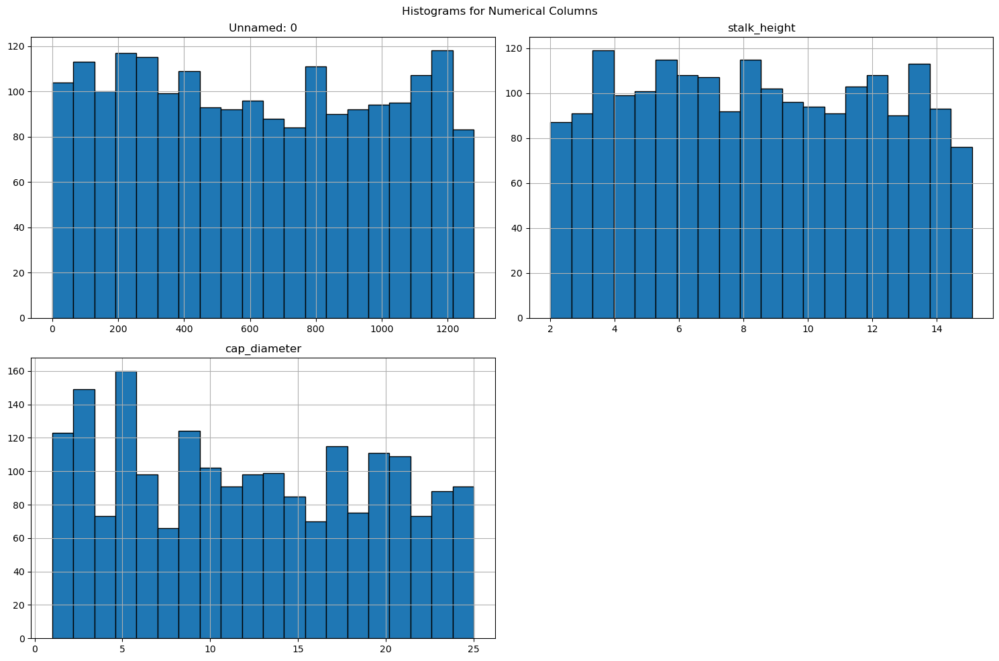

In [28]:
df[numerical_cols].hist(figsize=(15, 10), bins=20, edgecolor='black')
plt.suptitle("Histograms for Numerical Columns")
plt.tight_layout()
plt.show()

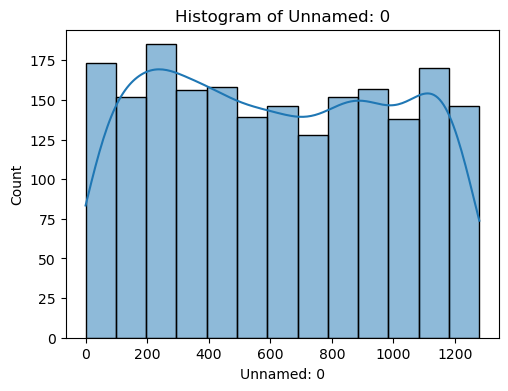

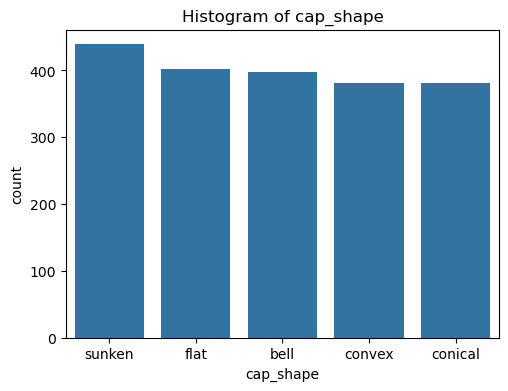

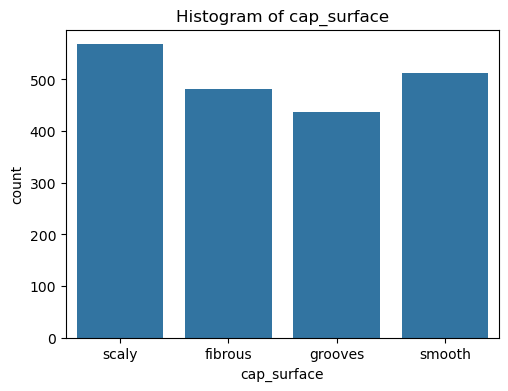

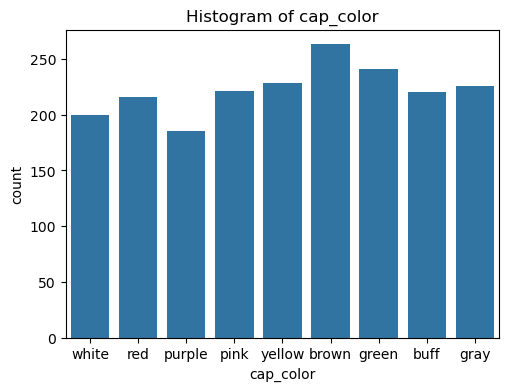

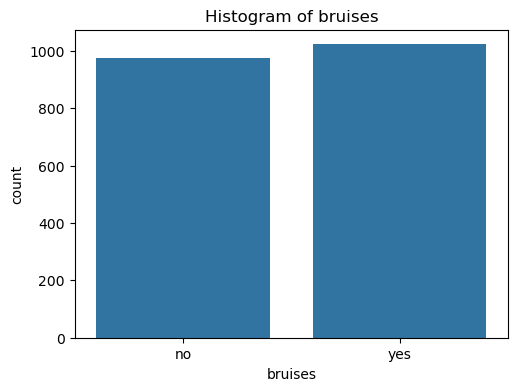

...

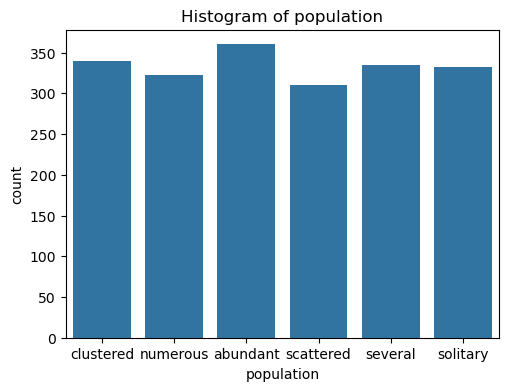

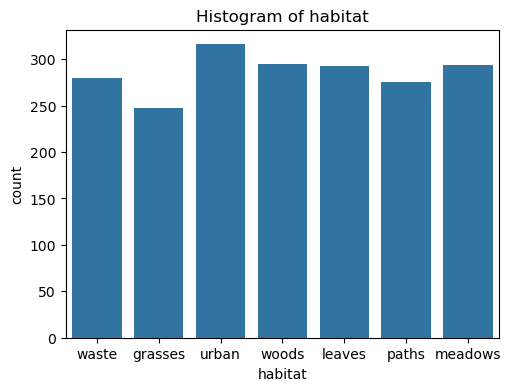

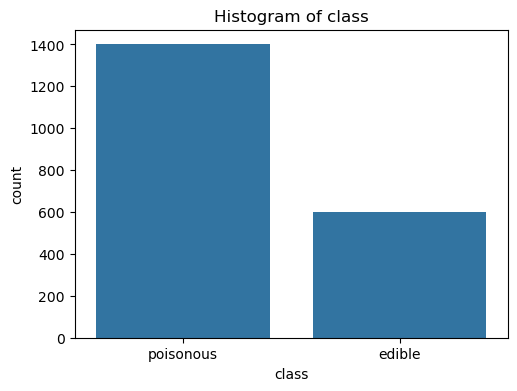

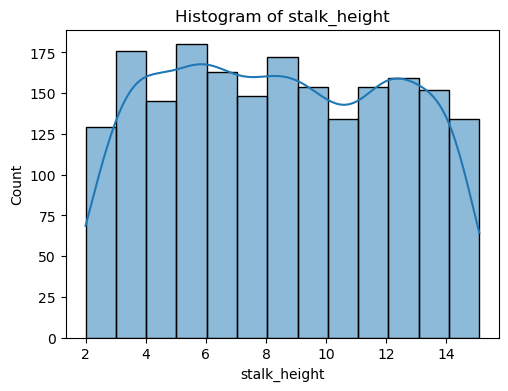

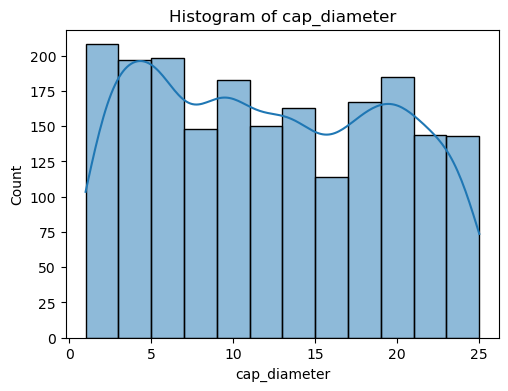

In [29]:
# or we can do it like this also:

for column in df.columns:
    plt.figure(figsize=(19, 4))

    # Histogram
    plt.subplot(1, 3, 1)
    if df[column].dtype == 'object':
        sns.countplot(x=column, data=df)
    else:
        sns.histplot(df[column], kde=True)
    plt.title(f'Histogram of {column}')

In [31]:
# Box Plot

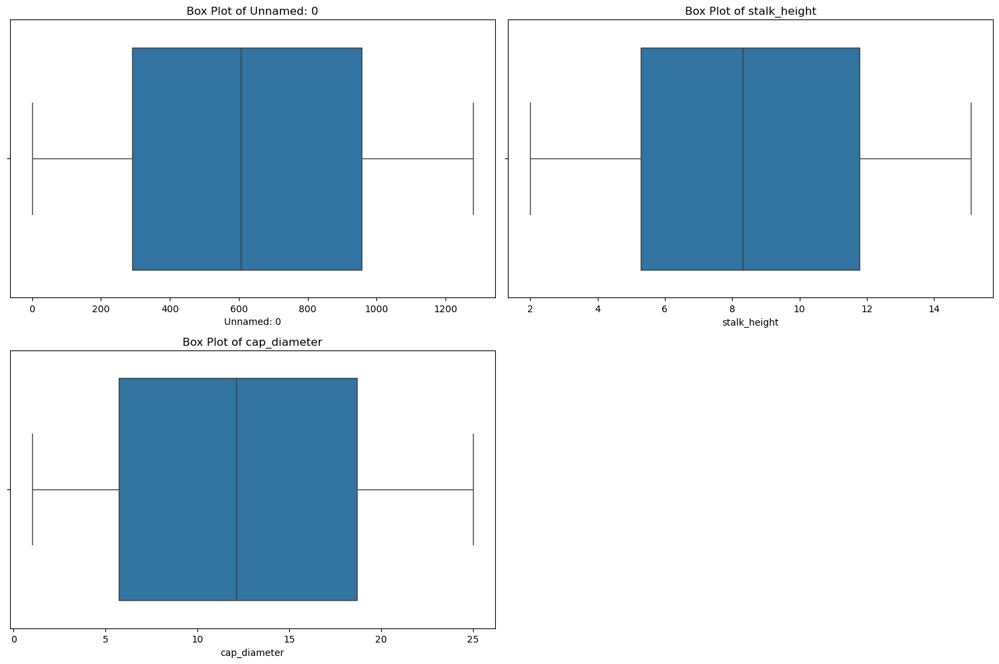

In [32]:
# Box plots for numerical columns
plt.figure(figsize=(15, 10))
for i, column in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) + 1) // 2, 2, i)  # Arrange in 2 columns
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}')
plt.tight_layout()
plt.show()

In [33]:
# 3.Density Plot

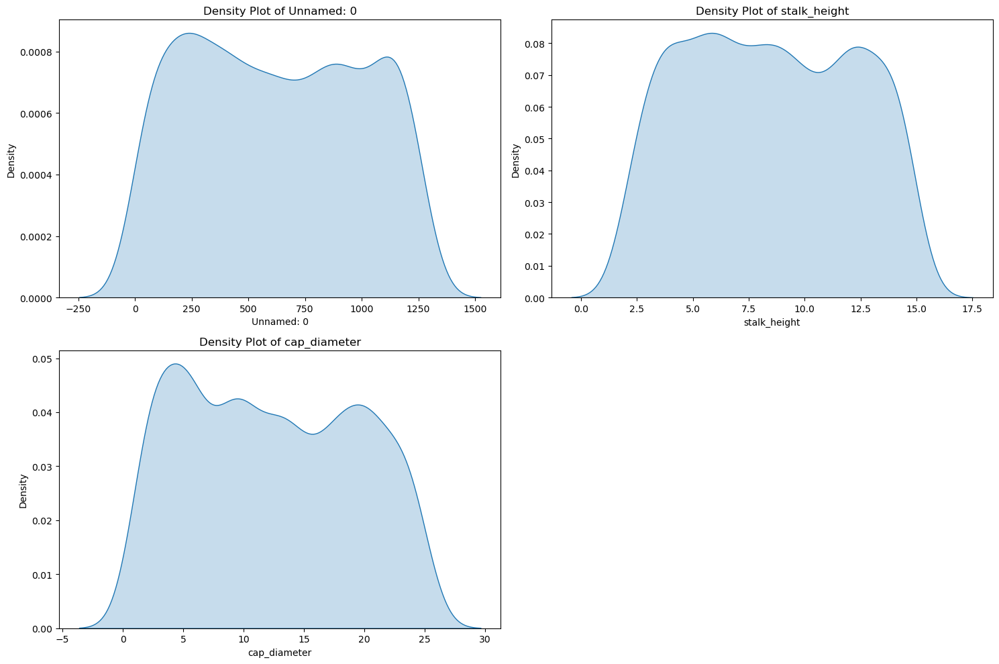

In [34]:
# Density plots for numerical columns
plt.figure(figsize=(15, 10))
for i, column in enumerate(numerical_cols, 1):
    plt.subplot((len(numerical_cols) + 1) // 2, 2, i)
    sns.kdeplot(df[column], shade=True)
    plt.title(f'Density Plot of {column}')
plt.tight_layout()
plt.show()

## 3.Investigate feature correlations to discern relationships within the data.

In [40]:
# Calculate the correlation matrix for numerical columns
numerical_data = df.select_dtypes(include=['float64', 'int64'])
correlation_matrix = numerical_data.corr()

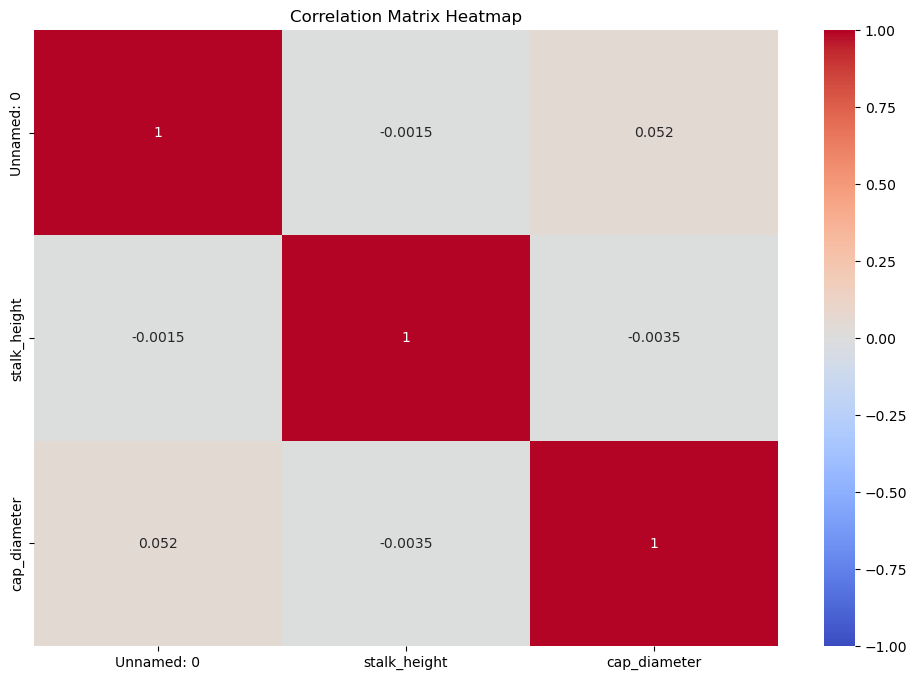

In [41]:
# Plot a heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix Heatmap")
plt.show()

# Task 2. Data Preprocessing

## 1.	Encode categorical variables if necessary.

In [47]:
label_encoder=LabelEncoder()   # package imported

In [49]:
# Encode each categorical column
for column in df.select_dtypes(include=['object']).columns:
    df[column] = label_encoder.fit_transform(df[column])

In [51]:
df.head(6)

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,4,2,7,0,1,1,2,0,7,...,0,0,2,6,3,1,5,1,14.276173,5.054983
1,1037,4,0,6,0,1,3,1,1,3,...,1,0,2,6,1,2,5,0,3.952715,19.068319
2,309,3,1,5,1,4,1,1,0,8,...,1,3,2,6,6,0,5,1,9.054265,7.205884
3,282,0,2,4,1,3,3,0,0,6,...,0,3,2,0,4,1,0,1,5.226499,20.932692
4,820,3,3,8,1,5,2,1,1,6,...,1,2,0,4,8,1,4,1,14.037532,12.545245
5,389,2,1,4,0,8,0,1,0,6,...,1,2,1,6,7,3,6,1,4.337043,16.189338


## 2.Split the dataset into training and testing sets.

In [54]:
# Separate features and target variable 
features=df.drop(columns='class')
target= df[['class']]

In [56]:
target

,class
0,1
1,0
2,1
3,1
4,1
...,...
1995,1
1996,1
1997,1
1998,1


In [58]:
# split data into training and testing

In [60]:
x_train,x_test,y_train,y_test=train_test_split(features,target,train_size=0.8,random_state=50)

In [62]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1600, 25)
(400, 25)
(1600, 1)
(400, 1)


In [64]:
# Standaardize the data

In [66]:
scaler=StandardScaler()

In [68]:
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

# Task 3: Data Visualization

## 1.	Employ scatter plots, pair plots, or relevant visualizations to comprehend feature distributions and relationships.

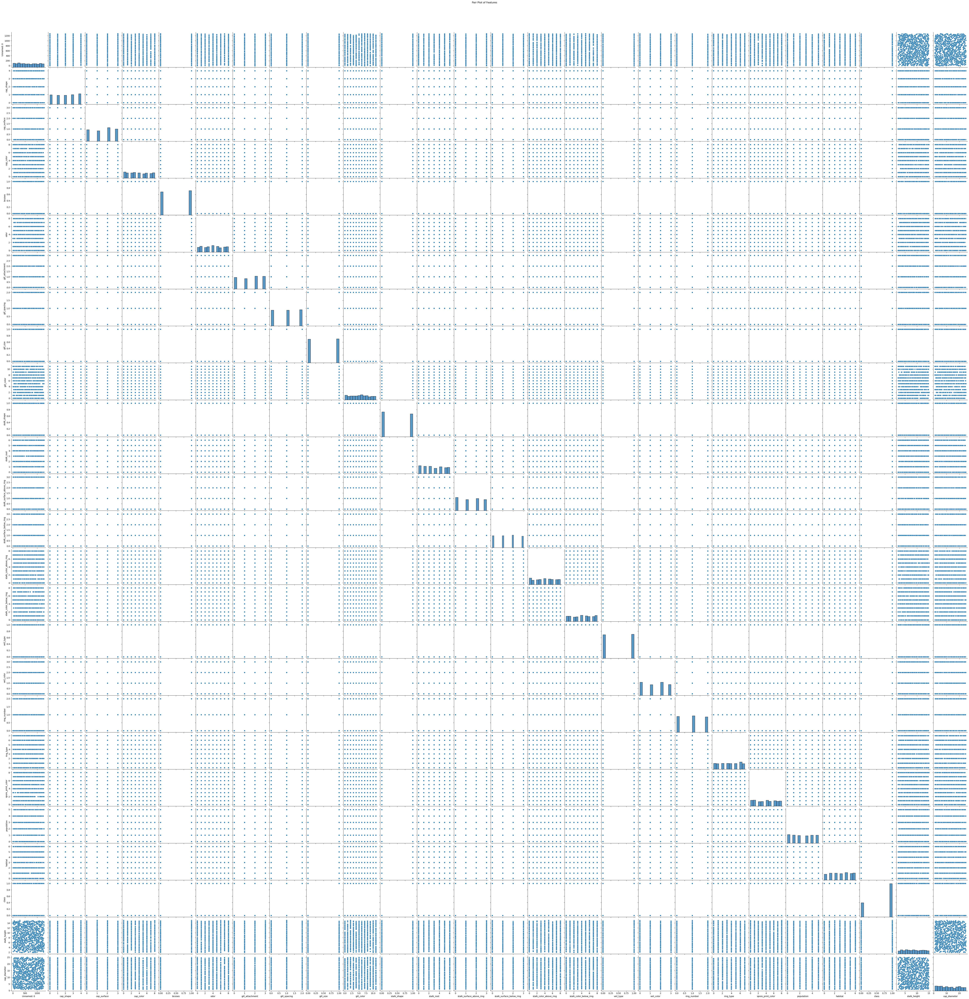

In [72]:
# Pair plot for all numerical columns

sns.pairplot(df)
plt.suptitle("Pair Plot of Features", y=1.02)
plt.show()

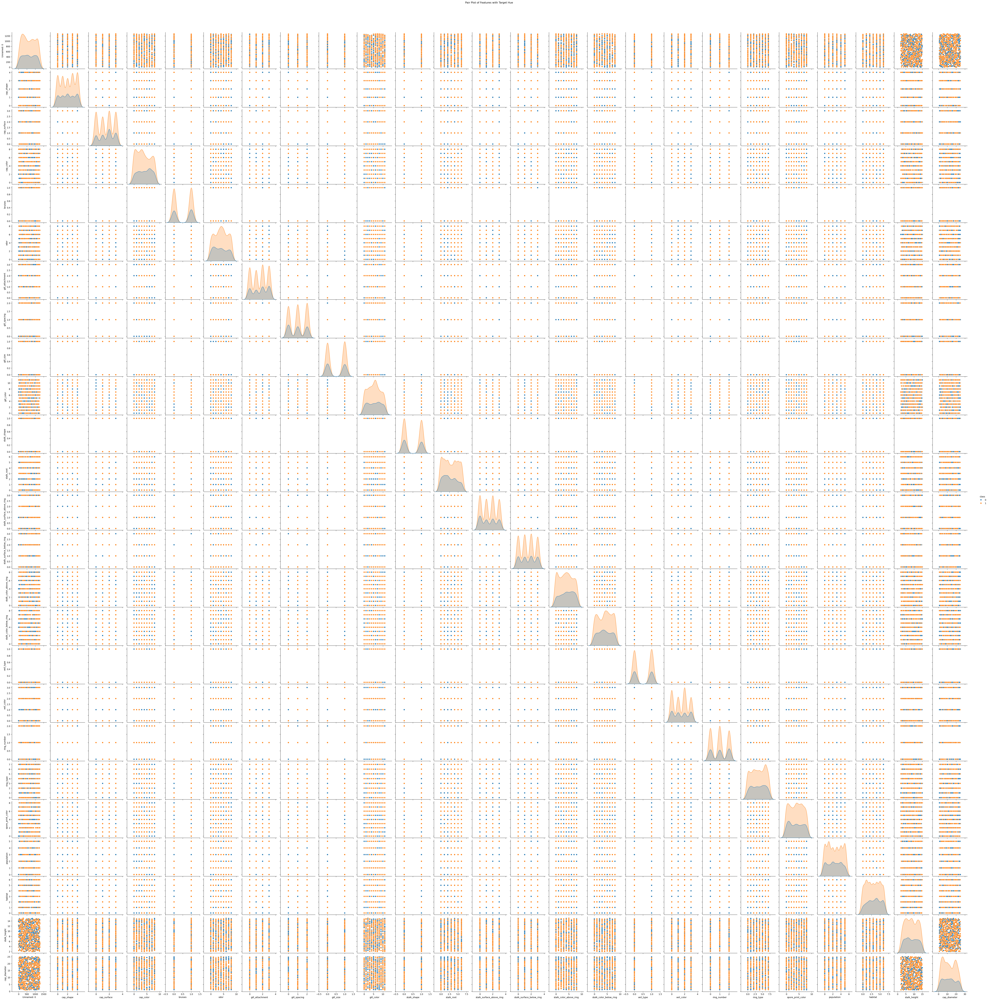

In [73]:
# Pair plot with target variable as hue
sns.pairplot(df, hue='class')
plt.suptitle("Pair Plot of Features with Target Hue", y=1.02)
plt.show()

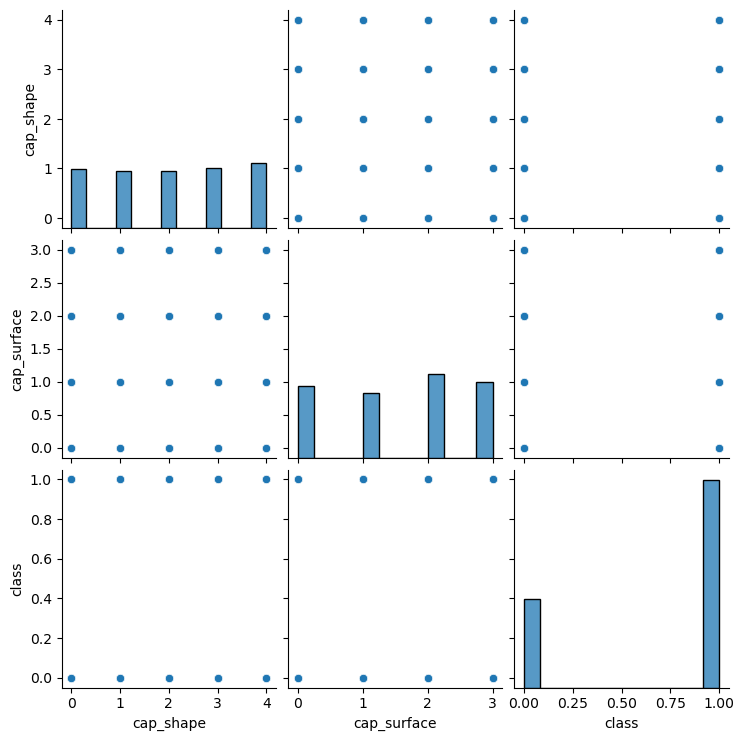

In [74]:
# Pair plot for a subset of features (lets take 2 features)
sns.pairplot(df[['cap_shape', 'cap_surface', 'class']])  
plt.show()

In [75]:
# Scatter PLots for specific feature pairs

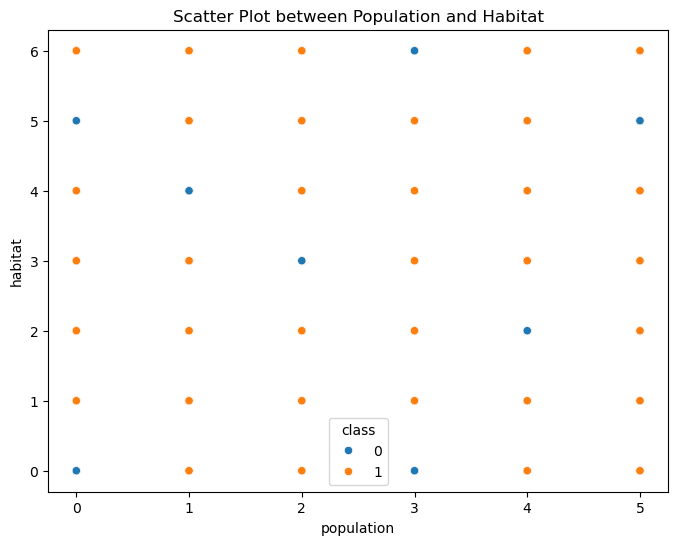

In [76]:
# Scatter plot between two specific features
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='population', y='habitat', hue='class')  #lets take any 2 colum.
plt.title("Scatter Plot between Population and Habitat")
plt.show()

In [77]:
# we will take another 2 columns

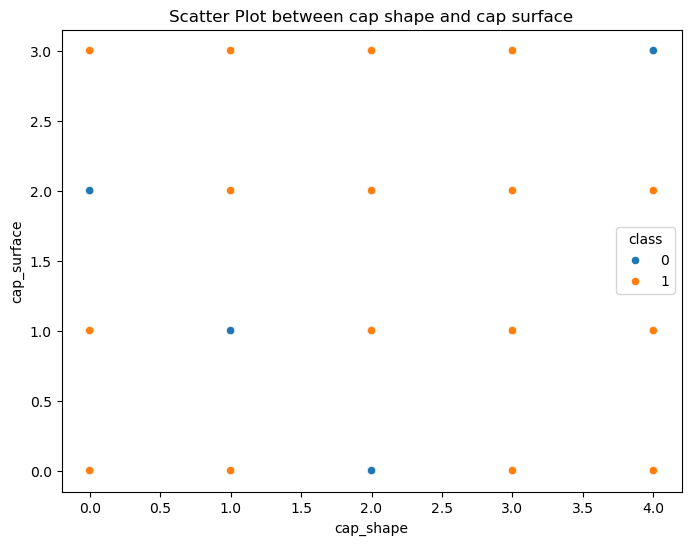

In [78]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='cap_shape', y='cap_surface', hue='class')  #lets take any 2 colum.
plt.title("Scatter Plot between cap shape and cap surface")
plt.show()

In [79]:
# Heatmap forFeature realtionships

In [80]:
correlation_matrix=df.corr()

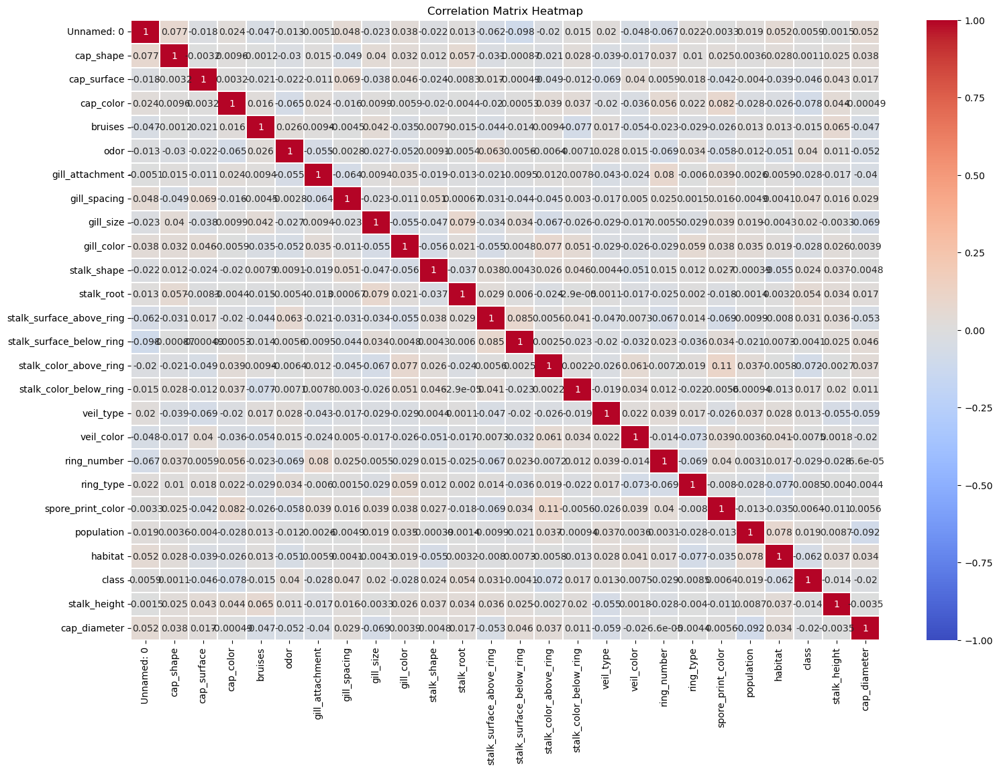

In [250]:
plt.figure(figsize=(18, 12))
sns.heatmap(correlation_matrix, linewidths=0.1,annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix Heatmap")
plt.show()


## 2.Visualize class distributions to gauge dataset balance or imbalance.

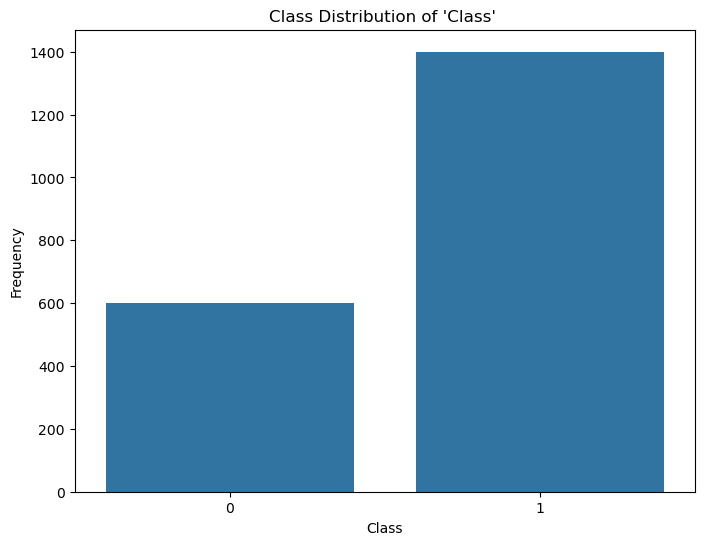

In [93]:
# Visualize the class distribution of the target variable
plt.figure(figsize=(8, 6))
sns.countplot(x='class', data=df)  
plt.title("Class Distribution of 'Class' ")
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.show()

In [95]:
# Calculate class proportions
class_counts = df['class'].value_counts(normalize=True) * 100  # Replace 'target_column' with your target column name
print("Class Distribution (%):\n", class_counts)

Class Distribution (%):
 class
1    70.0
0    30.0
Name: proportion, dtype: float64


In [97]:
# This will print the percentage of each class, making it easy to see if any class dominates.

# Task 4: SVM Implementation

In [100]:
# imported  SVM,SVC package above in line 1 already

In [252]:
svc=SVC(kernel='poly',C=1,gamma=0.3)  # will use linear 

In [254]:
svc.fit(x_train,y_train)

SVC(C=1, gamma=0.3, kernel='poly')

In [256]:
y_pred= svc.predict(x_test)

In [258]:
# Evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

In [260]:
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")

Accuracy: 0.8775
Precision: 0.8772944078947369
Recall: 0.8775
F1-Score: 0.8730700492447296


In [262]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.69      0.77       121
           1       0.88      0.96      0.92       279

    accuracy                           0.88       400
   macro avg       0.88      0.83      0.85       400
weighted avg       0.88      0.88      0.87       400



# Task 5. Visualization of SVM Results

In [265]:
from sklearn.metrics import ConfusionMatrixDisplay,precision_recall_curve

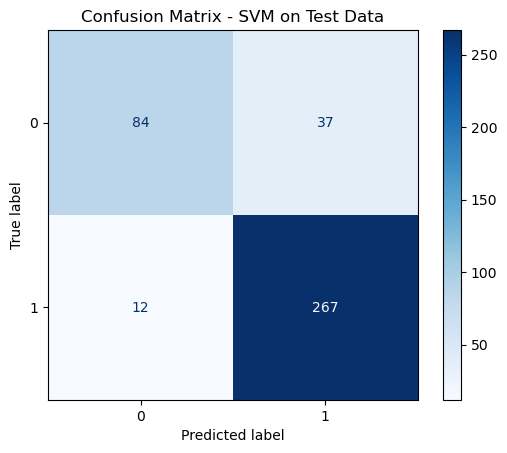

In [275]:
# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(svc, x_test, y_test, cmap="Blues")
plt.title("Confusion Matrix - SVM on Test Data")
plt.show()

In [269]:
label_encoder.classes_

array(['edible', 'poisonous'], dtype=object)

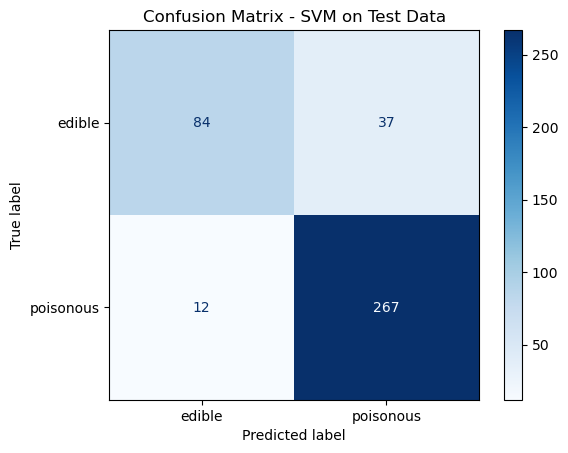

In [277]:
ConfusionMatrixDisplay.from_estimator(svc, x_test, y_test, display_labels=label_encoder.classes_,cmap="Blues")
plt.title("Confusion Matrix - SVM on Test Data")
plt.show()


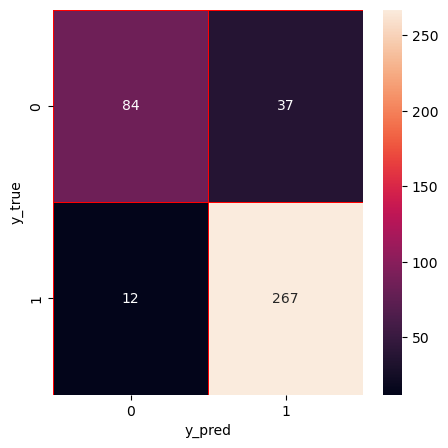

In [279]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
f, ax = plt.subplots(figsize =(5,5))
sns.heatmap(cm,annot = True,linewidths=0.5,linecolor="red",fmt = ".0f",ax=ax)
plt.xlabel("y_pred")
plt.ylabel("y_true")
plt.show()

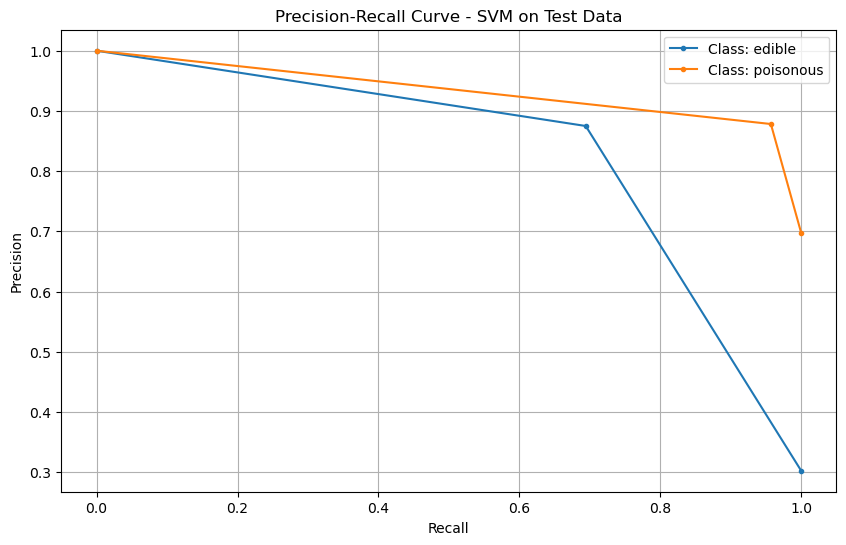

In [281]:
# Precision-Recall Curve
precision = {}
recall = {}
for i, label in enumerate(label_encoder.classes_):
    y_test_binary = (y_test == i).astype(int)
    y_pred_binary = (y_pred == i).astype(int)
    precision[label], recall[label], _ = precision_recall_curve(y_test_binary, y_pred_binary)

plt.figure(figsize=(10, 6))
for label in label_encoder.classes_:
    plt.plot(recall[label], precision[label], marker='.', label=f"Class: {label}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve - SVM on Test Data")
plt.legend()
plt.grid(True)
plt.show()

# Task 6: Parameter Tuning and Optimization

## 1.Experiment with different SVM hyperparameters (e.g., kernel type, regularization parameter) to optimize performance

In [285]:
# Use GridSearchCV to optimize SVM hyperparameters.

In [287]:
# Define parameter grid
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Grid search
grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy')
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf']},
             scoring='accuracy')

In [288]:
grid_search.best_params_

{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

In [289]:
grid_search.best_score_

0.8425

# Task 7. Comparison and Analysis

## Compare SVM performance with various kernels (e.g., linear, polynomial, radial basis function).

In [293]:
for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:
    svc = SVC(kernel=kernel, random_state=42)
    svc.fit(x_train, y_train)
    y_pred = svc.predict(x_test)
    print(f"\nKernel: {kernel}")
    print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


Kernel: linear
              precision    recall  f1-score   support

      edible       0.00      0.00      0.00       121
   poisonous       0.70      1.00      0.82       279

    accuracy                           0.70       400
   macro avg       0.35      0.50      0.41       400
weighted avg       0.49      0.70      0.57       400


Kernel: poly
              precision    recall  f1-score   support

      edible       0.91      0.50      0.65       121
   poisonous       0.82      0.98      0.89       279

    accuracy                           0.83       400
   macro avg       0.87      0.74      0.77       400
weighted avg       0.85      0.83      0.82       400


Kernel: rbf
              precision    recall  f1-score   support

      edible       1.00      0.27      0.43       121
   poisonous       0.76      1.00      0.86       279

    accuracy                           0.78       400
   macro avg       0.88      0.64      0.65       400
weighted avg       0.83      0.

## 2.Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results.

## 3. Practical Implications of SVM in real world classification tasks.

# ------- THE END --------